https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95?fbclid=IwAR3WB8cL1Qk7icQgbjaj8rw3iGGjo8M4wRIiEAb3zZC8anTow9uV4IvxTcU
https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Vehicles/bm4k-52h4?fbclid=IwAR17Ba6CEepQQTKNt5qIB-p2QQmSWS8HrTei1kygpXaWkKQeutg3IPGVjuo
https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Person/f55k-p6yu?fbclid=IwAR1k9QCQYOXIHXw061OGsCp0kmBlFOrSl310kjpSIpp2CYdgVb6odkgNm20

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import shapefile as shp
import urllib, gdal, subprocess
import json
import requests
import folium
import datetime
import warnings
import random
warnings.filterwarnings("ignore")
from bokeh.io import output_notebook,curdoc, show,output_file
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno
from bokeh.models import HoverTool
from bokeh.models.widgets import Panel, Tabs
import hvplot.pandas
import hvplot
import holoviews as hv

sns.set(style='darkgrid', palette='muted', color_codes=True)
#sns.mpl.rc('figure', figsize=(10,6))
# Set a plot style for nice plots.

# Magic command useful jupyter notebook
%matplotlib inline



#Set font size
plt.rcParams.update({'font.size':16})

In [58]:
%%time
filename = "data/crash_clean.csv"
filename2 = "data/people_clean.csv"
# filename = "crash_clean.csv"
p = 1 # 1% of the lines
# keep the header, then take only 1% of lines
# if random from [0,1] interval is greater than 0.01 the row will be skipped
df = pd.read_csv(
         filename,
         header=0, 
         skiprows=lambda i: i>0 and random.random() > p)

df_people = pd.read_csv(
         filename2,
         header=0, 
         skiprows=lambda i: i>0 and random.random() > p)

Wall time: 11.2 s


# DF Crash

In [59]:
df.head()

,Unnamed: 0,CRASH DATE,CRASH TIME,BOROUGH,LATITUDE,LONGITUDE,ON STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2
0,1,06/01/2016,13:54,QUEENS,40.655834,-73.839035,CROSS BAY BOULEVARD,0.0,0.0,0,0,0,0,0,0,Driver Inattention/Distraction,Driver Inattention/Distraction,3453947,PASSENGER VEHICLE,PASSENGER VEHICLE
1,2,05/23/2016,6:15,Unspecified,40.752937,-73.922040,NORTHERN BOULEVARD,0.0,0.0,0,0,0,0,0,0,Driver Inattention/Distraction,Unspecified,3452402,PASSENGER VEHICLE,PASSENGER VEHICLE
2,3,06/03/2016,11:00,Unspecified,40.680893,-73.871376,GLEN STREET,1.0,0.0,1,0,0,0,0,0,Failure to Yield Right-of-Way,Unspecified,3482311,PASSENGER VEHICLE,Unspecified
3,4,06/03/2016,17:15,QUEENS,40.665558,-73.729850,HOOK CREEK BOULEVARD,0.0,0.0,0,0,0,0,0,0,Unspecified,Unspecified,3455499,PASSENGER VEHICLE,PASSENGER VEHICLE
4,5,06/04/2016,13:20,BROOKLYN,40.689530,-73.909134,Unspecified,0.0,0.0,0,0,0,0,0,0,Passing Too Closely,Unspecified,3455042,PASSENGER VEHICLE,PASSENGER VEHICLE


In [60]:
df.shape

(1469484, 20)

In [61]:
(df =='Unspecified').sum()

Unnamed: 0                             0
CRASH DATE                             0
CRASH TIME                             0
BOROUGH                           337794
LATITUDE                               0
LONGITUDE                              0
ON STREET NAME                    277998
NUMBER OF PERSONS INJURED             15
NUMBER OF PERSONS KILLED              28
NUMBER OF PEDESTRIANS INJURED          0
NUMBER OF PEDESTRIANS KILLED           0
NUMBER OF CYCLIST INJURED              0
NUMBER OF CYCLIST KILLED               0
NUMBER OF MOTORIST INJURED             0
NUMBER OF MOTORIST KILLED              0
CONTRIBUTING FACTOR VEHICLE 1     533483
CONTRIBUTING FACTOR VEHICLE 2    1268225
COLLISION_ID                           0
VEHICLE TYPE CODE 1                    0
VEHICLE TYPE CODE 2               254243
dtype: int64

In [62]:
df.describe()

,Unnamed: 0,LATITUDE,LONGITUDE,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,COLLISION_ID
count,1.469484e+06,1.469484e+06,1.469484e+06,1.469484e+06,1.469484e+06,1.469484e+06,1.469484e+06,1.469484e+06,1.469484e+06,1.469484e+06
mean,8.305041e+05,4.072405e+01,-7.392975e+01,5.343508e-02,6.410413e-04,2.146127e-02,8.030030e-05,1.893542e-01,4.348465e-04,2.863153e+06
std,4.762915e+05,7.903168e-02,1.094026e+00,2.375947e-01,2.589543e-02,1.459829e-01,9.036311e-03,6.171669e-01,2.296099e-02,1.505996e+06
min,1.000000e+00,3.078418e+01,-2.013600e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.200000e+01
25%,4.207688e+05,4.066895e+01,-7.397683e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.821018e+06
50%,8.260025e+05,4.072258e+01,-7.392929e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.518876e+06
75%,1.235255e+06,4.076817e+01,-7.386687e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.909682e+06
max,1.672366e+06,4.334444e+01,-3.276851e+01,2.700000e+01,6.000000e+00,4.000000e+00,2.000000e+00,4.300000e+01,5.000000e+00,4.309045e+06


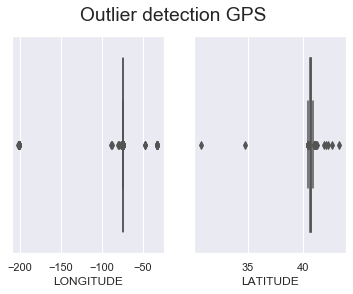

In [11]:
figure,(ax1,ax2) = plt.subplots(1,2)

plt.subplot(ax1)
ax1 = sns.boxplot(df.LONGITUDE)
plt.subplot(ax2)
ax2 = sns.boxplot(df.LATITUDE)

plt.suptitle('Outlier detection GPS')
plt.savefig('outlier')

In [63]:
df = df.loc[(df.LONGITUDE >-77) & (df.LONGITUDE < -69) & (df.LATITUDE <43) & (df.LATITUDE > 38)]

In [ ]:
# output_file('testmap.html')

In [ ]:
NYC = x_range, y_range = ((-74.05, -73.7), (40.6, 40.9))

In [ ]:
hover = HoverTool(tooltips=[("error", "$NUMBER OF PERSONS KILLED"),
                            ("state", "@NUMBER OF PERSONS KILLED")
                            
                           ])

In [ ]:
m = df.hvplot.points(x='LONGITUDE',y='LATITUDE',xlim=x_range,ylim=y_range
                 ,logz=True,width=700,height=500,cmap=inferno,datashade=True).opts(bgcolor='black',
                                                                                  title='Vehicle Collisions and Crashes')

# renderer = hv.renderer('bokeh')

# # Using renderer save
# renderer.save(m, 'graph.html')
show(m)


In [68]:
expre = pd.to_numeric(df['NUMBER OF PERSONS INJURED'][df['NUMBER OF PERSONS INJURED'] != 'Unspecified']).astype(int)
expr1 = pd.to_numeric(df['NUMBER OF PERSONS KILLED'][df['NUMBER OF PERSONS KILLED'] != 'Unspecified']).astype(int)

In [65]:
df['CRASH TIME'] = pd.to_datetime(df['CRASH TIME'])
df['CRASH DATE'] = pd.to_datetime(df['CRASH DATE'])

In [ ]:
df_snip = df.sample(n=10000)

In [26]:
# For each point the the dataframe create a marker on the map. 
mapz = folium.Map([40.730610, -73.935242], zoom_start=11)
for i in range(len(df_snip)):
    folium.CircleMarker([df_snip.LATITUDE.iloc[i], df_snip.LONGITUDE.iloc[i]],fill=True, # Set fill to True
                                fill_color='blue',
                                color = 'blue',
                                radius = 0.05
                 ).add_to(mapz)

# Display map
mapz

In [27]:
from folium import plugins
from folium.plugins import HeatMap

In [28]:
mapz = folium.Map([40.730610, -73.935242], zoom_start=13,tiles = 'Stamen Toner')

stationArr = df_snip[['LATITUDE', 'LONGITUDE']].values

# plot heatmap
mapz.add_children(plugins.HeatMap(stationArr, radius=13))
mapz

In [29]:
df_burg2015 = df_snip

In [30]:
import warnings
warnings.filterwarnings("ignore")

map_hooray = folium.Map(location=[40.730610, -73.935242],zoom_start = 12) 

# Filter the DF for rows, then columns, then remove NaNs
heat_df = df_burg2015[['LATITUDE', 'LONGITUDE']]

# Create weight column, using date
heat_df['Weight'] = df_burg2015['CRASH TIME'].dt.hour # extracting the date from the string
heat_df['Weight'] = heat_df['Weight'].astype(float)
heat_df = heat_df.dropna(axis=0, subset=['LATITUDE','LONGITUDE', 'Weight'])
# List comprehension to make out list of lists
heat_data = [[[row['LATITUDE'],row['LONGITUDE']] for index, row in heat_df[heat_df['Weight'] == i].iterrows()] for i in range(0,23)]

# Plot it on the map
hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8)
hm.add_to(map_hooray)
# Display the map
map_hooray

In [32]:
# from folium.plugins import MarkerCluster
import folium.plugins

NY_COORDINATES = ([40.730610, -73.935242])
# gdata = pd.read_csv('green_tripdata.csv')
MAX_RECORDS = 10000
map_nyccrash = folium.Map(location=NY_COORDINATES, zoom_start=9)
marker_cluster = folium.plugins.MarkerCluster().add_to(map_nyccrash)
for each in df[0:MAX_RECORDS].iterrows():
    folium.Marker(
        location = [each[1]['LATITUDE'],each[1]['LONGITUDE']], popup=(each[1]['CRASH TIME'],each[1]['COLLISION_ID'])).add_to(marker_cluster)
map_nyccrash

In [33]:
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,Unnamed: 0,LATITUDE,LONGITUDE,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,COLLISION_ID
Unnamed: 0,1.00,-0.01,-0.03,0.01,0.00,-0.00,-0.00,-0.02,0.00,-0.61
LATITUDE,-0.01,1.00,0.33,0.01,-0.00,-0.00,-0.00,-0.02,-0.00,0.01
LONGITUDE,-0.03,0.33,1.00,-0.01,0.00,-0.03,-0.00,0.05,0.00,0.06
NUMBER OF PEDESTRIANS INJURED,0.01,0.01,-0.01,1.00,0.01,-0.03,0.00,-0.06,-0.00,-0.03
NUMBER OF PEDESTRIANS KILLED,0.00,-0.00,0.00,0.01,1.00,-0.00,0.03,0.00,0.01,-0.00
NUMBER OF CYCLIST INJURED,-0.00,-0.00,-0.03,-0.03,-0.00,1.00,0.00,-0.04,-0.00,-0.01
NUMBER OF CYCLIST KILLED,-0.00,-0.00,-0.00,0.00,0.03,0.00,1.00,-0.00,-0.00,0.00
NUMBER OF MOTORIST INJURED,-0.02,-0.02,0.05,-0.06,0.00,-0.04,-0.00,1.00,0.03,0.02
NUMBER OF MOTORIST KILLED,0.00,-0.00,0.00,-0.00,0.01,-0.00,-0.00,0.03,1.00,-0.00
COLLISION_ID,-0.61,0.01,0.06,-0.03,-0.00,-0.01,0.00,0.02,-0.00,1.00


In [89]:
plt.rcParams.update({'axes.titlesize': 32,'axes.labelsize':28})

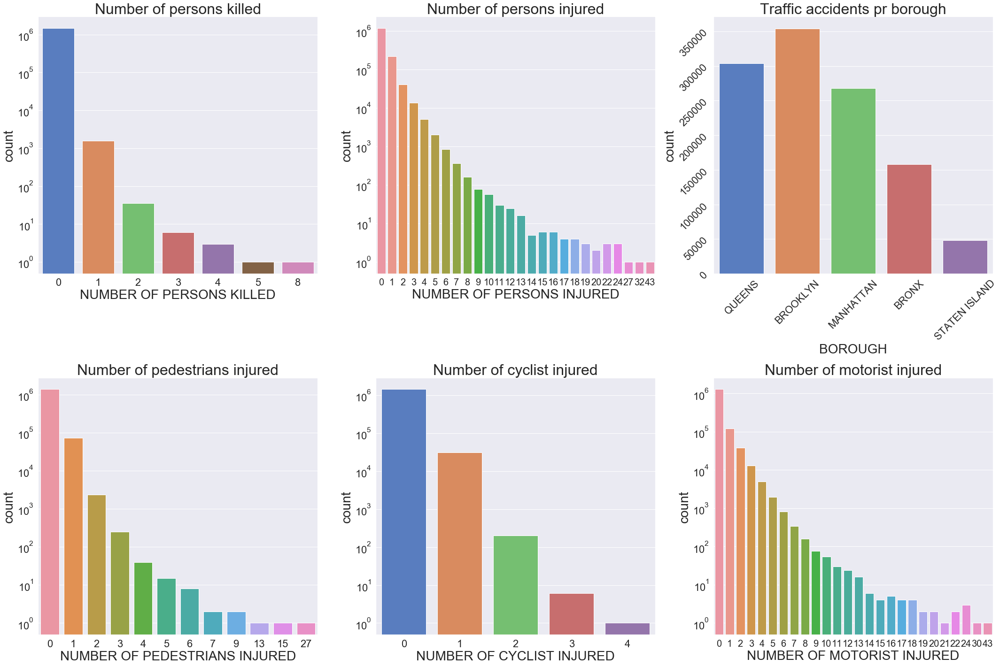

In [99]:
fig,ax =  plt.subplots(2,3,figsize=(30,20))

sns.countplot(expr1,ax=ax[0,0])
ax[0,0].set_title('Number of persons killed')
ax[0,0].set_yscale('log')
ax[0,0].tick_params(axis="x", labelsize=22) 
ax[0,0].tick_params(axis="y", labelsize=22) 
sns.countplot(expre,ax=ax[0,1])
ax[0,1].set_title('Number of persons injured')
ax[0,1].set_yscale('log')
ax[0,1].tick_params(axis="x", labelsize=20) 
ax[0,1].tick_params(axis="y", labelsize=22) 
#ax[0,1].tick_params(axis = 'x',labelrotation=55)
sns.countplot(df['BOROUGH'][df['BOROUGH'] != 'Unspecified'],ax=ax[0,2])
ax[0,2].set_title('Traffic accidents pr borough')
ax[0,2].tick_params(labelrotation=45)
ax[0,2].tick_params(axis="x", labelsize=22) 
ax[0,2].tick_params(axis="y", labelsize=22) 
sns.countplot(pd.to_numeric(df['NUMBER OF PEDESTRIANS INJURED'][df['NUMBER OF PEDESTRIANS INJURED'] != 'Unspecified']),ax=ax[1,0])
ax[1,0].set_title('Number of pedestrians injured')
ax[1,0].set_yscale('log')
ax[1,0].tick_params(axis="x", labelsize=22) 
ax[1,0].tick_params(axis="y", labelsize=22) 
sns.countplot(pd.to_numeric(df['NUMBER OF CYCLIST INJURED'][df['NUMBER OF CYCLIST INJURED'] != 'Unspecified']),ax=ax[1,1])
ax[1,1].set_title('Number of cyclist injured')
ax[1,1].set_yscale('log')
ax[1,1].tick_params(axis="x", labelsize=22) 
ax[1,1].tick_params(axis="y", labelsize=22) 
sns.countplot(pd.to_numeric(df['NUMBER OF MOTORIST INJURED'][df['NUMBER OF MOTORIST INJURED'] != 'Unspecified']),ax=ax[1,2])
ax[1,2].set_title('Number of motorist injured')
ax[1,2].set_yscale('log')
ax[1,2].tick_params(axis="x", labelsize=20) 
ax[1,2].tick_params(axis="y", labelsize=22)
#ax[1,2].tick_params(axis = 'x',labelrotation=55)
plt.tight_layout()
plt.savefig("docs/injuries_seaborn.png",bbox_inches='tight',dpi=500)
plt.show()

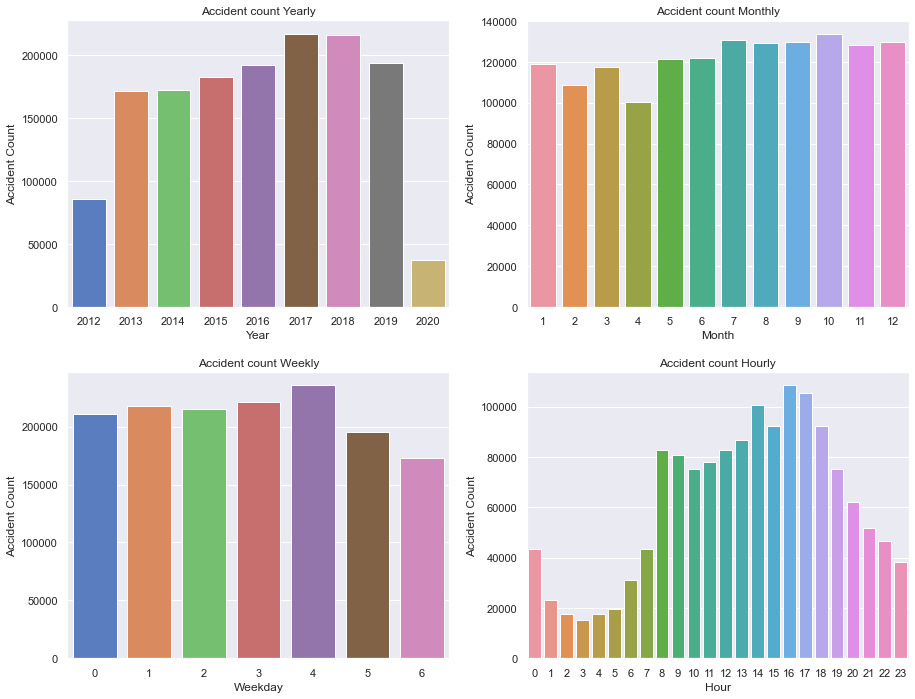

In [41]:
fig,ax =  plt.subplots(2,2,figsize=(13,10))

sns.countplot(df['CRASH DATE'].dt.year,ax=ax[0,0])
ax[0,0].set_title('Accident count Yearly')
ax[0,0].set_xlabel('Year')
ax[0,0].set_ylabel('Accident Count')
sns.countplot(df['CRASH DATE'].dt.month,ax=ax[0,1])
ax[0,1].set_title('Accident count Monthly')
ax[0,1].set_xlabel('Month')
ax[0,1].set_ylabel('Accident Count')
sns.countplot(df['CRASH DATE'].dt.weekday,ax=ax[1,0])
ax[1,0].set_title('Accident count Weekly')
ax[1,0].set_xlabel('Weekday')
ax[1,0].set_ylabel('Accident Count')
sns.countplot(df['CRASH TIME'].dt.hour,ax=ax[1,1])
ax[1,1].set_title('Accident count Hourly')
ax[1,1].set_xlabel('Hour')
ax[1,1].set_ylabel('Accident Count')
plt.tight_layout()
plt.show()

In [38]:
mask = df['NUMBER OF PERSONS KILLED'] >0
df_fat = df[mask]


In [39]:
df_fat.groupby('NUMBER OF PERSONS KILLED').size()

NUMBER OF PERSONS KILLED
1.0    325
2.0      7
3.0      1
4.0      2
dtype: int64

In [40]:
mapz = folium.Map([40.730610, -73.935242], zoom_start=11)
for i in range(len(df_fat)):
    folium.CircleMarker([df_fat.LATITUDE.iloc[i], df_fat.LONGITUDE.iloc[i]],fill=True, # Set fill to True
                                fill_color='blue',
                                color = 'blue',
                                radius = 0.05,
                        popup=('Number of persons killed', df_fat['NUMBER OF PERSONS KILLED'].iloc[i])
                 ).add_to(mapz)

# Display map
mapz

In [41]:
mapz = folium.Map([40.730610, -73.935242], zoom_start=12,tiles = 'Stamen Toner')

stationArr = df_fat[['LATITUDE', 'LONGITUDE']].values

# plot heatmap
mapz.add_children(plugins.HeatMap(stationArr,radius=14))
mapz

# DF People

In [158]:
df =df_people

In [159]:
df.head()

,Unnamed: 0,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,PERSON_ID,PERSON_TYPE,PERSON_INJURY,VEHICLE_ID,PERSON_AGE,PED_ROLE,PERSON_SEX
0,0,10252788,4230640,10/25/2019,17:42,0278267c-0b21-470f-8a54-da71b7361448,Occupant,Unspecified,19142923.0,0.0,Passenger,F
1,1,10253512,4230733,10/10/2019,19:45,81161123-516c-438d-8f29-a107d2783d85,Occupant,Unspecified,19143291.0,Unspecified,Registrant,U
2,2,10250662,4230235,10/26/2019,10:40,b5da9aa6-3230-4203-bbde-3b6f9248ac31,Occupant,Injured,19141868.0,11.0,Passenger,F
3,3,10252894,4231115,10/26/2019,18:45,4ed210b6-678c-4fe3-ae8c-3ecd30eae7aa,Pedestrian,Injured,Unspecified,30.0,Pedestrian,M
4,4,6650180,3565527,11/21/2016,13:05,2782525,Occupant,Unspecified,Unspecified,Unspecified,Notified Person,U


In [160]:
df.shape

(3908459, 12)

In [162]:
df_age = df[df['PERSON_AGE'] != 'Unspecified']
df_age['PERSON_AGE'] = pd.to_numeric(df_age['PERSON_AGE'])
df_age = df_age.loc[(df_age['PERSON_AGE']>0) & (df_age['PERSON_AGE'] <100 )]

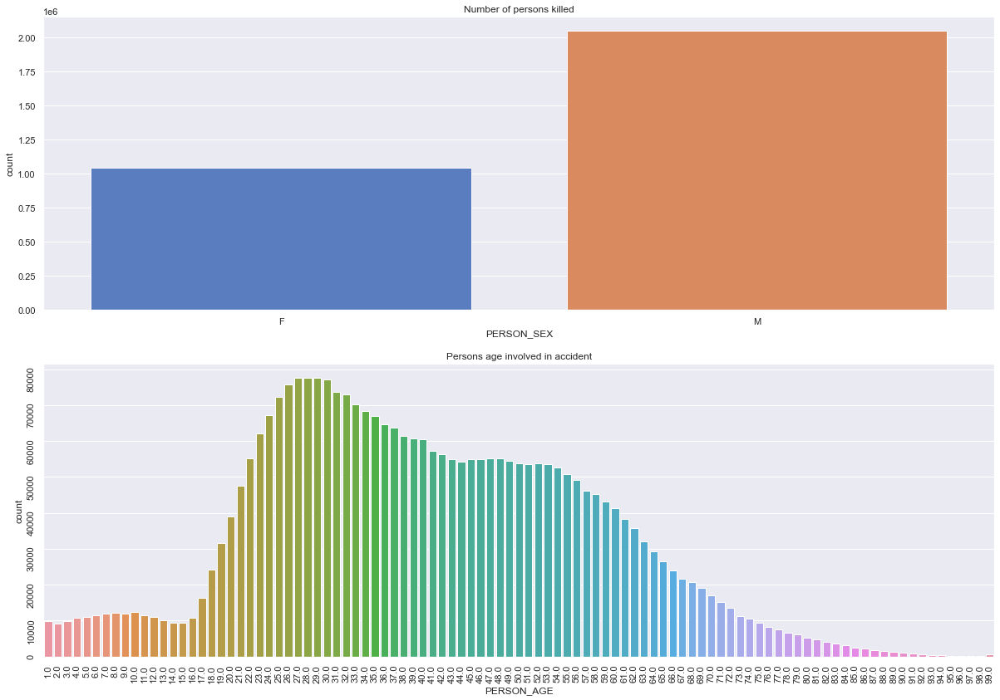

In [172]:
fig,ax =  plt.subplots(2,figsize=(17,12))
sns.countplot(df['PERSON_SEX'][df['PERSON_SEX'] != 'U'],ax=ax[0])
ax[0].set_title('Number of persons killed')

sns.countplot(pd.to_numeric(df_age['PERSON_AGE'][df_age['PERSON_AGE'] != 'Unspecified']),ax=ax[1])
ax[1].set_title('Persons age involved in accident')
ax[1].tick_params(labelrotation=90)
plt.tight_layout()
plt.show()